## Defining the map

In [1]:
# Import the numpy library, which provides support for large multi-dimensional arrays and matrices
import numpy as np

# Create a 100x100 matrix initialized with zeros using numpy's zeros function
# This could represent a physical environment where each cell corresponds to a 1m x 1m area
matrix = np.zeros((100, 100))

# The indices of the matrix correspond to positions in the physical environment.
# Specifically, each index change in the matrix corresponds to a 1m change in the physical environment.
# For example, matrix[1][1] corresponds to the point (1m, 1m) in the physical environment.
# So, if you're modeling something like radio wave intensity, matrix[i][j] would hold the intensity at point (i*1m, j*1m)


## Defining the buildings

In [2]:
# Define a list of buildings, each represented as a dictionary with the coordinates of its top-left and bottom-right corners
buildings = [
    {"top_left": (20, 30), "bottom_right": (30, 40)},
    {"top_left": (60, 35), "bottom_right": (70, 55)},
    {"top_left": (20, 50), "bottom_right": (30, 60)},
    {"top_left": (40, 60), "bottom_right": (50, 70)},
    {"top_left": (50, 20), "bottom_right": (60, 30)},
]

# Define a function to add a building to the matrix
def add_building(matrix, top_left, bottom_right, building_value, corner_value):
    """
    Add a building to the matrix.
    
    Parameters:
    - matrix: The environment matrix.
    - top_left: A tuple (x1, y1) representing the top-left corner of the building.
    - bottom_right: A tuple (x2, y2) representing the bottom-right corner of the building.
    - building_value: The value to assign to the building cells.
    - corner_value: The value to assign to the corners of the building.
    """
    x1, y1 = top_left
    x2, y2 = bottom_right
    
    # Assign the building value to the cells that correspond to the building's location
    matrix[x1:x2+1, y1:y2+1] = building_value
    
    # Assign the corner value to the corners of the building
    matrix[x1, y1] = matrix[x1, y2] = matrix[x2, y1] = matrix[x2, y2] = corner_value

# Add each building in the buildings list to the matrix using the add_building function
for i, building in enumerate(buildings):
    add_building(matrix, building["top_left"], building["bottom_right"], 1, 2)

# Find the coordinates of the corners of the buildings (where the matrix value is 2)
corners = np.where(matrix == 2)


## Defining the transmitter

In [3]:
# Define the location of the transmitter as a tuple (x, y)
transmitter_location = (5,20)

# Define a function to add a transmitter to the matrix
def add_transmitter(matrix, location, transmitter_value):
    """
    Add a transmitter to the matrix.
    
    Parameters:
    - matrix: The environment matrix.
    - location: A tuple (x, y) representing the location of the transmitter.
    - transmitter_value: The value to assign to the transmitter cell.
    """
    x, y = location
    
    # Assign the transmitter value to the cell that corresponds to the transmitter's location
    matrix[x, y] = transmitter_value

# Add the transmitter to the matrix at the specified location using the add_transmitter function
add_transmitter(matrix, transmitter_location, 3)


## Defining the receiver

In [4]:
# Define the location of the receiver as a tuple (x, y)
receiver_location = (95, 50)

# Define a function to add a receiver to the matrix
def add_receiver(matrix, location, receiver_value):
    """
    Add a receiver to the matrix.
    
    Parameters:
    - matrix: The environment matrix.
    - location: A tuple (x, y) representing the location of the receiver.
    - receiver_value: The value to assign to the receiver cell.
    """
    x, y = location
    
    # Assign the receiver value to the cell that corresponds to the receiver's location
    matrix[x, y] = receiver_value

# Add the receiver to the matrix at the specified location using the add_receiver function
add_receiver(matrix, receiver_location, 4)


## Ploting the map

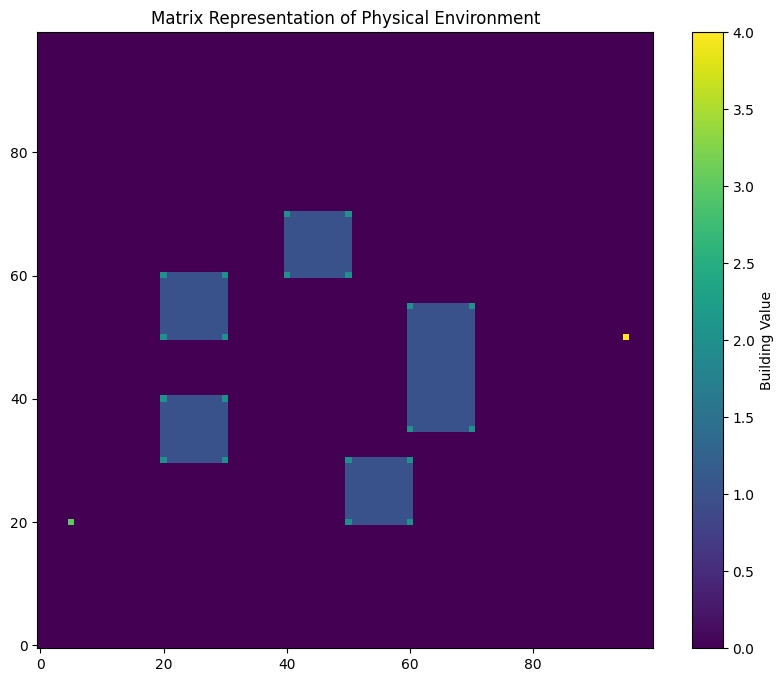

In [5]:
# Import the matplotlib library, which provides a way to create static, animated, and interactive visualizations in Python
import matplotlib.pyplot as plt

# Define a function to plot a given matrix
def plot_matrix(matrix):
    """
    Plot the given matrix.
    
    Parameters:
    - matrix: The matrix to plot.
    """
    # Create a new figure with a specified size (20x20)
    plt.figure(figsize=(10, 8))
    
    # Display the matrix as an image, transposing it before plotting for correct orientation
    # The 'viridis' colormap is used, which is a perceptually uniform colormap in matplotlib
    # The origin is set to 'lower' to place the [0,0] index of the array in the bottom left corner of the plot
    plt.imshow(matrix.T, cmap='viridis', origin='lower')
    
    # Add a colorbar to the plot with a label
    plt.colorbar(label='Building Value')
    
    # Set the title of the plot
    plt.title('Matrix Representation of Physical Environment')
    
    # Display the plot
    plt.show()

# Plot the matrix using the plot_matrix function
plot_matrix(matrix)


# Corner settings

## Corner type

In [6]:
# Extract the first and second elements of the 'corners' tuple, which are numpy arrays representing the x and y coordinates of the corners
a = corners[0]
b = corners[1]

# Convert the numpy arrays to Python lists using the tolist() function
a_list = a.tolist()
b_list = b.tolist()

# Create a list of tuples, where each tuple represents the (x, y) coordinates of a corner
# The zip() function is used to pair up the corresponding elements of the 'a' and 'b' lists
adjusted_corners_tuples = list(zip(a, b))


In [7]:
# Initialize an empty dictionary to store the classifications of the corners
corner_classifications = {}

# Loop through each corner in the list of corners
for corner in adjusted_corners_tuples:
    x, y = corner  # Unpack the corner tuple into x and y coordinates
    
    # Get the values of the cells to the left, right, above, and below the corner
    left_val = matrix[x - 1, y]
    right_val = matrix[x + 1, y]
    above_val = matrix[x, y + 1]
    below_val = matrix[x, y - 1]
    
    # Classify the corner based on the values of the neighboring cells
    if left_val == 1 and above_val == 1:
        corner_type = 3
    elif left_val == 1 and below_val == 1:
        corner_type = 4
    elif right_val == 1 and above_val == 1:
        corner_type = 1
    elif right_val == 1 and below_val == 1:
        corner_type = 2
    
    # Determine if the corner is under (0) or above (1) the transmitter
    if y < transmitter_location[1]:
        above_transmitter = 0
    else:
        above_transmitter = 1
    
    # Add the classification and the above/under transmitter value to the dictionary
    corner_classifications[corner] = (corner_type, above_transmitter)

# Print the classifications
# Loop through each item in the corner_classifications dictionary
for corner, classification in corner_classifications.items():
    # Print a formatted string with the corner coordinates, its classification, and whether it's above or under the transmitter
    print(f"Corner {corner} is classified as {classification[0]} and is {'above' if classification[1] == 1 else 'under'} the transmitter.")


Corner (20, 30) is classified as 1 and is above the transmitter.
Corner (20, 40) is classified as 2 and is above the transmitter.
Corner (20, 50) is classified as 1 and is above the transmitter.
Corner (20, 60) is classified as 2 and is above the transmitter.
Corner (30, 30) is classified as 3 and is above the transmitter.
Corner (30, 40) is classified as 4 and is above the transmitter.
Corner (30, 50) is classified as 3 and is above the transmitter.
Corner (30, 60) is classified as 4 and is above the transmitter.
Corner (40, 60) is classified as 1 and is above the transmitter.
Corner (40, 70) is classified as 2 and is above the transmitter.
Corner (50, 20) is classified as 1 and is above the transmitter.
Corner (50, 30) is classified as 2 and is above the transmitter.
Corner (50, 60) is classified as 3 and is above the transmitter.
Corner (50, 70) is classified as 4 and is above the transmitter.
Corner (60, 20) is classified as 3 and is above the transmitter.
Corner (60, 30) is classi

## Calculating distances

In [8]:
# Define a function to calculate the Euclidean distance between two points
def euclidean_distance(point1, point2):
    """
    Calculate the Euclidean distance between two points.
    
    Parameters:
    - point1: A tuple (x1, y1) representing the first point.
    - point2: A tuple (x2, y2) representing the second point.
    
    Returns:
    - The Euclidean distance between the two points.
    """
    x1, y1 = point1
    x2, y2 = point2
    # Use the Euclidean distance formula to calculate the distance
    return np.sqrt((x2 - x1)**2 + (y2 - y1)**2)

# Initialize two empty lists to store the distances from the corners to the transmitter and receiver
transmitter_distances = []
receiver_distances = []

# Loop through each corner
for i in range(len(corners[0])):
    # Get the location of the corner
    corner_location = (corners[0][i], corners[1][i])
    
    # Calculate the distances from the corner to the transmitter and receiver using the euclidean_distance function
    transmitter_distance = euclidean_distance(transmitter_location, corner_location)
    receiver_distance = euclidean_distance(receiver_location, corner_location)
    
    # Append the distances to the respective lists
    transmitter_distances.append(transmitter_distance)
    receiver_distances.append(receiver_distance)

# Convert the lists to numpy arrays for easier manipulation in future calculations
transmitter_distances = np.array(transmitter_distances)
receiver_distances = np.array(receiver_distances)

# Print the distances
print(f"Transmitter distances: {transmitter_distances}")
print(f"Receiver distances: {receiver_distances}")


Transmitter distances: [18.02775638 25.         33.54101966 42.72001873 26.92582404 32.01562119
 39.05124838 47.16990566 53.15072906 61.03277808 45.         46.09772229
 60.20797289 67.26812024 55.         55.90169944 57.00877125 65.19202405
 66.70832032 73.8241153 ]
Receiver distances: [77.62087348 75.66372975 75.         75.66372975 68.00735254 65.76473219
 65.         65.76473219 55.90169944 58.52349955 54.08326913 49.24428901
 46.09772229 49.24428901 46.09772229 40.31128874 38.07886553 35.35533906
 29.15475947 25.49509757]


## Calculating angles

In [9]:
# Define a function to calculate the angle in radians between two points
def calculate_angle_radians(point1, point2):
    """
    Calculate the angle between two points in radians.
    
    Parameters:
    - point1: A tuple (x1, y1) representing the first point.
    - point2: A tuple (x2, y2) representing the second point.
    
    Returns:
    - The angle in radians between the two points.
    """
    x1, y1 = point1
    x2, y2 = point2
    # Use the arctan2 function from numpy to calculate the angle
    # The absolute difference in y-coordinates is the opposite side, and the absolute difference in x-coordinates is the adjacent side
    angle = np.arctan2(np.abs(y1 - y2), np.abs(x2 - x1))
    # Ensure the angle is positive
    if angle < 0:
        angle += 2 * np.pi
    return angle

# Initialize two empty lists to store the angles from the corners to the transmitter and receiver
transmitter_angles_radians = []
receiver_angles_radians = []

# Loop through each corner
for i in range(len(corners[0])):
    # Get the location of the corner
    corner_location = (corners[0][i], corners[1][i])
    
    # Calculate the angles from the corner to the transmitter and receiver using the calculate_angle_radians function
    transmitter_angle_radians = calculate_angle_radians(transmitter_location, corner_location)
    receiver_angle_radians = calculate_angle_radians(receiver_location, corner_location)
    
    # Append the angles to the respective lists
    transmitter_angles_radians.append(transmitter_angle_radians)
    receiver_angles_radians.append(receiver_angle_radians)

# Convert the lists to numpy arrays for easier manipulation in future calculations
transmitter_angles_radians = np.array(transmitter_angles_radians)
receiver_angles_radians = np.array(receiver_angles_radians)

# Print the angles
print(f"Transmitter angles in radians: {transmitter_angles_radians}")
print(f"Receiver angles in radians: {receiver_angles_radians}")


Transmitter angles in radians: [0.5880026  0.92729522 1.10714872 1.21202566 0.38050638 0.67474094
 0.87605805 1.01219701 0.85196633 0.96007036 0.         0.21866895
 0.72664234 0.83798123 0.         0.1798535  0.26625205 0.56672922
 0.22679885 0.49394137]
Receiver angles in radians: [0.26060239 0.13255153 0.         0.13255153 0.29849893 0.15264933
 0.         0.15264933 0.1798535  0.348771   0.5880026  0.41822433
 0.21866895 0.41822433 0.70862627 0.51914611 0.40489179 0.14189705
 0.5404195  0.19739556]


## Determining line of sights

In [10]:
# Define a function to generate points along a line using Bresenham's line algorithm
def bresenham_line(x1, y1, x2, y2):
    """
    Generate points along a line using Bresenham's line algorithm.
    
    Parameters:
    - x1, y1: The coordinates of the first point.
    - x2, y2: The coordinates of the second point.
    
    Returns:
    - A list of points along the line.
    """
    # Initialize an empty list to store the points
    points = []
    
    # Calculate the differences in x and y coordinates
    dx = x2 - x1
    dy = y2 - y1

    # Start from the first point
    x, y = x1, y1
    
    # If the line is more horizontal than vertical
    if abs(dx) > abs(dy):
        steps = abs(dx)
        p = 2 * abs(dy) - abs(dx)
        const1 = 2 * abs(dy)
        const2 = 2 * (abs(dy) - abs(dx))
        
        # Generate the points along the line
        for i in range(steps):
            points.append((x, y))
            if dx > 0:
                x += 1
            else:
                x -= 1
            if p < 0:
                p += const1
            else:
                if dy > 0:
                    y += 1
                else:
                    y -= 1
                p += const2
    else:  # If the line is more vertical than horizontal
        steps = abs(dy)
        p = 2 * abs(dx) - abs(dy)
        const1 = 2 * abs(dx)
        const2 = 2 * (abs(dx) - abs(dy))
        
        # Generate the points along the line
        for i in range(steps):
            points.append((x, y))
            if dy > 0:
                y += 1
            else:
                y -= 1
            if p < 0:
                p += const1
            else:
                if dx > 0:
                    x += 1
                else:
                    x -= 1
                p += const2

    # Add the last point
    points.append((x2, y2))
    
    # Return the list of points
    return points


In [11]:
# Initialize a matrix to store the visibility of each corner
# This matrix will be used to keep track of which corners of the buildings are visible from the transmitter and receiver
visibility_matrix = np.zeros((100, 100))
offset = -1  # Define an offset to adjust the corner points

# Calculate the line of sight for each corner from the transmitter's perspective
for i, building in enumerate(buildings):
    # For each corner of the building
    for corner in [building["top_left"], (building["top_left"][0], building["bottom_right"][1]), building["bottom_right"], (building["bottom_right"][0], building["top_left"][1])]:
        # Offset the corner points to avoid the building walls
        offset_corner = (corner[0] + offset if corner[0] > transmitter_location[0] else corner[0] - offset, 
                         corner[1] + offset if corner[1] > transmitter_location[1] else corner[1] - offset)
        # Generate the points along the line from the transmitter to the offset corner
        line_points = bresenham_line(transmitter_location[0], transmitter_location[1], offset_corner[0], offset_corner[1])
        # If none of the points on the line are inside a building (value == 1)
        if not any(matrix[int(x)][int(y)] == 1 for x, y in line_points):
            # The corner is not blocked from the transmitter's perspective, so add 1 to its value in the visibility matrix
            visibility_matrix[corner[0], corner[1]] += 1

# Calculate the line of sight for each corner from the receiver's perspective
for i, building in enumerate(buildings):
    # Only consider corners to the left of the receiver
    for corner in [building["top_left"], (building["top_left"][0], building["bottom_right"][1]), building["bottom_right"], (building["bottom_right"][0], building["top_left"][1])]:
        if corner[0] < receiver_location[0]:
            # Offset the corner points to avoid the building walls
            offset_corner = (corner[0] + offset if corner[0] > receiver_location[0] else corner[0] - offset, 
                             corner[1] + offset if corner[1] > receiver_location[1] else corner[1] - offset)
            # Generate the points along the line from the receiver to the offset corner
            line_points = bresenham_line(receiver_location[0], receiver_location[1], offset_corner[0], offset_corner[1])
            # If none of the points on the line are inside a building (value == 1)
            if not any(matrix[int(x)][int(y)] == 1 for x, y in line_points):
                # The corner is not blocked from the receiver's perspective, so add 2 to its value in the visibility matrix
                visibility_matrix[corner[0], corner[1]] += 2

# Get the coordinates of the corners with non-zero visibility values
non_zero_corners = np.transpose(np.nonzero(visibility_matrix))

# Print the corners with non-zero visibility values
print("The corners with non-zero visibility values are:")
for corner in non_zero_corners:
    x, y = corner
    visibility_value = visibility_matrix[x, y]
    # Determine the visibility description based on the visibility value
    if visibility_value == 1:
        visibility_description = "visible from the transmitter's perspective"
    elif visibility_value == 2:
        visibility_description = "visible from the receiver's perspective"
    elif visibility_value == 3:
        visibility_description = "visible from both perspectives"
    # Print the corner coordinates and its visibility description
    print(f"Corner at ({x}, {y}) is {visibility_description}")


The corners with non-zero visibility values are:
Corner at (20, 30) is visible from the transmitter's perspective
Corner at (20, 40) is visible from the transmitter's perspective
Corner at (20, 50) is visible from the transmitter's perspective
Corner at (20, 60) is visible from the transmitter's perspective
Corner at (30, 30) is visible from the transmitter's perspective
Corner at (50, 20) is visible from the transmitter's perspective
Corner at (50, 30) is visible from the transmitter's perspective
Corner at (50, 70) is visible from the receiver's perspective
Corner at (60, 20) is visible from the receiver's perspective
Corner at (60, 35) is visible from the transmitter's perspective
Corner at (70, 35) is visible from the receiver's perspective
Corner at (70, 55) is visible from the receiver's perspective


In [12]:
# Create a set of corners in the matrix for quick lookup
corner_set = set(zip(corners[0], corners[1]))

# Define a function to check if the line between two corners is blocked
def is_blocked(corner1, corner2, matrix):
    # Apply the same adjustments to corner1 and corner2 as were applied to create adjusted_corners
    adj1 = 0
    adj11 = 0
    # Check the cells around corner1 and adjust its coordinates accordingly
    if matrix[corner1[0]+1, corner1[1]] == 1:  # Check below
        corner1 = (corner1[0]-1, corner1[1])
        adj1 = 1
    elif matrix[corner1[0]-1, corner1[1]] == 1:  # Check above
        corner1 = (corner1[0]+1, corner1[1])
        adj1 = -1
    if matrix[corner1[0] + adj1, corner1[1]+1] == 1:  # Check right
        corner1 = (corner1[0], corner1[1]-1)
        adj11 = 1
    elif matrix[corner1[0] + adj1, corner1[1]-1] == 1:  # Check left
        corner1 = (corner1[0], corner1[1]+1)
        adj11 = -1

    # Do the same for corner2
    adj2 = 0
    adj22 = 0
    if matrix[corner2[0]+1, corner2[1]] == 1:  # Check below
        corner2 = (corner2[0]-1, corner2[1])
        adj2 = 1
    elif matrix[corner2[0]-1, corner2[1]] == 1:  # Check above
        corner2 = (corner2[0]+1, corner2[1])
        adj2 = -1
    if matrix[corner2[0] + adj2, corner2[1]+1] == 1:  # Check right
        corner2 = (corner2[0], corner2[1]-1)
        adj22 = 1
    elif matrix[corner2[0] + adj2, corner2[1]-1] == 1:  # Check left
        adj22 = -1
        corner2 = (corner2[0], corner2[1]+1)

    # Generate the points on the line between corner1 and corner2.
    line_points = bresenham_line(corner1[0], corner1[1], corner2[0], corner2[1])

    # Check if any of the points on the line is blocked in the matrix.
    is_path_blocked = any(matrix[int(x)][int(y)] == 1 for x, y in line_points)
    d = corner1[0] - corner2[0]
    # Check if any of the points on the line is a corner in the matrix.
    is_corner_in_path = any(matrix[int(x)][int(y)] == 2 for x, y in line_points)
    is_backward = d > 0
    # Return True if there is a blockage or a corner between corner1 and corner2.
    f = is_path_blocked or is_corner_in_path or is_backward
    if f:
        return f
    
    # If no corner is found, return False.
    return f

# Create a visibility matrix for each corner
corner_visibility_matrices = []
for i in range(len(corners[0])):
    corner1 = (corners[0][i], corners[1][i])
    corner_visibility_matrix = np.zeros((100, 100))
    for j in range(len(corners[0])):
        c = 0
        corner2 = (corners[0][j], corners[1][j])
        if corner1 != corner2 and not is_blocked(corner1, corner2, matrix):
            # Iterate over the matrix within the rectangle boundaries.
            if corner1[1] == corner2[1]:
                for x in range(corner1[0] + 1, corner2[0] - 1):
                    # If the current point is a corner, return True.
                    if matrix[x][corner1[1]] == 2:
                        c += 1
                if c == 0:
                    corner_visibility_matrix[corner2[0], corner2[1]] = 1
            elif corner1[0] == corner2[0]:
                y_min, y_max = corner1[1], corner2[1]
                for y in range(y_min + 1, y_max - 1):
                    # If the current point is a corner, return True.
                    if matrix[corner1[0]][y] == 2:
                        c += 1
                if c == 0:
                    corner_visibility_matrix[corner2[0], corner2[1]] = 1
                        
            else:
                corner_visibility_matrix[corner2[0], corner2[1]] = 1
    corner_visibility_matrices.append(corner_visibility_matrix)

# For each corner, print the corners that are in its line of sight
for i, corner_visibility_matrix in enumerate(corner_visibility_matrices):
    visible_corners = np.transpose(np.nonzero(corner_visibility_matrix))
    print(f"Corners visible from corner at coordinates {corners[0][i], corners[1][i]}:")
    for visible_corner in visible_corners:
        print(visible_corner)


Corners visible from corner at coordinates (20, 30):
[20 40]
[30 30]
[50 20]
Corners visible from corner at coordinates (20, 40):
[20 30]
[20 50]
[30 40]
[30 50]
[50 60]
[60 55]
Corners visible from corner at coordinates (20, 50):
[20 30]
[20 40]
[20 60]
[30 40]
[30 50]
[50 30]
[60 30]
[60 35]
Corners visible from corner at coordinates (20, 60):
[20 30]
[20 40]
[20 50]
[30 60]
[40 70]
Corners visible from corner at coordinates (30, 30):
[30 40]
[40 60]
[40 70]
[50 20]
[50 30]
[50 60]
[60 35]
[60 55]
[70 35]
Corners visible from corner at coordinates (30, 40):
[30 30]
[30 50]
[40 60]
[40 70]
[50 20]
[50 30]
[50 60]
[60 30]
[60 35]
[60 55]
Corners visible from corner at coordinates (30, 50):
[30 30]
[30 40]
[30 60]
[40 60]
[40 70]
[50 20]
[50 30]
[50 60]
[60 30]
[60 35]
[60 55]
Corners visible from corner at coordinates (30, 60):
[30 30]
[30 40]
[30 50]
[40 60]
[40 70]
[50 20]
[50 30]
[60 30]
[60 35]
[60 55]
Corners visible from corner at coordinates (40, 60):
[40 70]
[50 20]
[50 30]
[50

## Modeling with the UDT method

In [13]:
# Import the numpy library for numerical operations and scipy.special for special functions
import numpy as np
import scipy.special as sp

# Define a function to calculate the UTD diffraction coefficient for a perfectly conducting pi/2 wedge
def utd_diffraction_coefficient(u, v, d1, d2, lambda_):
    """
    Calculate the UTD diffraction coefficient for a perfectly conducting pi/2 wedge.

    Parameters:
    - u (float): The incidence angle in radians.
    - v (float): The observation angle in radians.
    - d1 (float): The distance from the source point to the diffraction point.
    - d2 (float): The distance from the diffraction point to the observation point.
    - lambda_ (float): The wavelength of the wave.

    Returns:
    - complex: The UTD diffraction coefficient.
    """
    # Calculate the wavenumber using the formula k = 2*pi / lambda
    k = 2 * np.pi / lambda_

    # Calculate the difference and sum of the angles
    diff_angle = v - u
    sum_angle = v + u

    # Handle very small angles to avoid numerical issues
    if np.isclose(diff_angle, 0):
        diff_angle = 1e-10  # Small perturbation to avoid zero division

    # Calculate the Fresnel integral factor
    F = np.sqrt(2 / (np.pi * k * d1 * d2 * np.abs(np.sin(diff_angle))))

    # Calculate the auxiliary function
    f = np.exp(1j * np.pi / 4) * np.sqrt(k * np.abs(np.sin(diff_angle)))

    # Calculate the phase shifts due to the distances
    phase_shift = np.exp(-1j * k * (d1 + d2))

    # Calculate the Bessel function terms using a more accurate handling of angles
    bessel_term_0 = sp.jv(0, k * np.sin(sum_angle / 2))
    bessel_term_1 = sp.jv(1, k * np.sin(sum_angle / 2))
    bessel_term = bessel_term_0 + 1j * bessel_term_1

    # Calculate the UTD diffraction coefficient
    D = -1j * F * f * bessel_term * phase_shift

    # Return the UTD diffraction coefficient
    return D


In [14]:
# Define a function to find all paths from a start point to an end point using depth-first search (DFS)
def find_all_paths_dfs(start, end, visibility_matrix, corner_visibility_matrices, corners, path=[]):
    # Add the start point to the current path
    path = path + [start]

    # If the start point is the end point, return the current path
    if start == end:
        return [path]

    # Initialize an empty list to store the paths
    paths = []

    # For each corner in the list of corners
    for corner in corners:
        # If the corner is not already in the current path
        if corner not in path:
            # If the start point is the transmitter
            if start == transmitter_location:
                # If the corner is visible from the transmitter's perspective
                if visibility_matrix[corner[0], corner[1]] in [1, 3]:
                    # Recursively find all paths from the corner to the end point
                    new_paths = find_all_paths_dfs(corner, end, visibility_matrix, corner_visibility_matrices, corners, path)
                    # Add the new paths to the list of paths
                    paths.extend(new_paths)
            # If the start point is a corner
            elif start in corners:
                # Get the visibility matrix for the start corner
                corner_visibility_matrix = corner_visibility_matrices[corners.index(start)]
                # If the corner is visible from the start corner's perspective and is to the right of the start corner
                if corner_visibility_matrix[corner[0], corner[1]] == 1  and corner[0] > start[0]:
                    # Recursively find all paths from the corner to the end point
                    new_paths = find_all_paths_dfs(corner, end, visibility_matrix, corner_visibility_matrices, corners, path)
                    # Add the new paths to the list of paths
                    paths.extend(new_paths)

    # If the last point in the path is a corner and is visible from both the transmitter's and receiver's perspectives
    if path[-1] in corners and visibility_matrix[path[-1][0], path[-1][1]] in [2, 3]:
        # Recursively find all paths from the end point to itself
        new_paths = find_all_paths_dfs(end, end, visibility_matrix, corner_visibility_matrices, corners, path)
        # Add the new paths to the list of paths
        paths.extend(new_paths)

    # Return the list of paths
    return paths

# Find all paths from the transmitter to the receiver using the find_all_paths_dfs function
all_paths = find_all_paths_dfs(transmitter_location, receiver_location, visibility_matrix, corner_visibility_matrices, adjusted_corners_tuples)

# Print the found paths for debugging
print("Found paths:")
for path in all_paths:
    print(path)


Found paths:
[(5, 20), (20, 30), (30, 30), (40, 60), (50, 20), (60, 20), (70, 35), (95, 50)]
[(5, 20), (20, 30), (30, 30), (40, 60), (50, 20), (60, 20), (95, 50)]
[(5, 20), (20, 30), (30, 30), (40, 60), (50, 30), (60, 30), (70, 35), (95, 50)]
[(5, 20), (20, 30), (30, 30), (40, 60), (50, 30), (60, 35), (70, 35), (95, 50)]
[(5, 20), (20, 30), (30, 30), (40, 60), (50, 30), (60, 55), (70, 55), (95, 50)]
[(5, 20), (20, 30), (30, 30), (40, 60), (50, 30), (70, 35), (95, 50)]
[(5, 20), (20, 30), (30, 30), (40, 60), (50, 60), (60, 35), (70, 35), (95, 50)]
[(5, 20), (20, 30), (30, 30), (40, 60), (50, 60), (60, 55), (70, 55), (95, 50)]
[(5, 20), (20, 30), (30, 30), (40, 60), (50, 60), (70, 55), (95, 50)]
[(5, 20), (20, 30), (30, 30), (40, 60), (60, 30), (70, 35), (95, 50)]
[(5, 20), (20, 30), (30, 30), (40, 60), (60, 35), (70, 35), (95, 50)]
[(5, 20), (20, 30), (30, 30), (40, 60), (60, 55), (70, 55), (95, 50)]
[(5, 20), (20, 30), (30, 30), (40, 60), (70, 55), (95, 50)]
[(5, 20), (20, 30), (30, 30

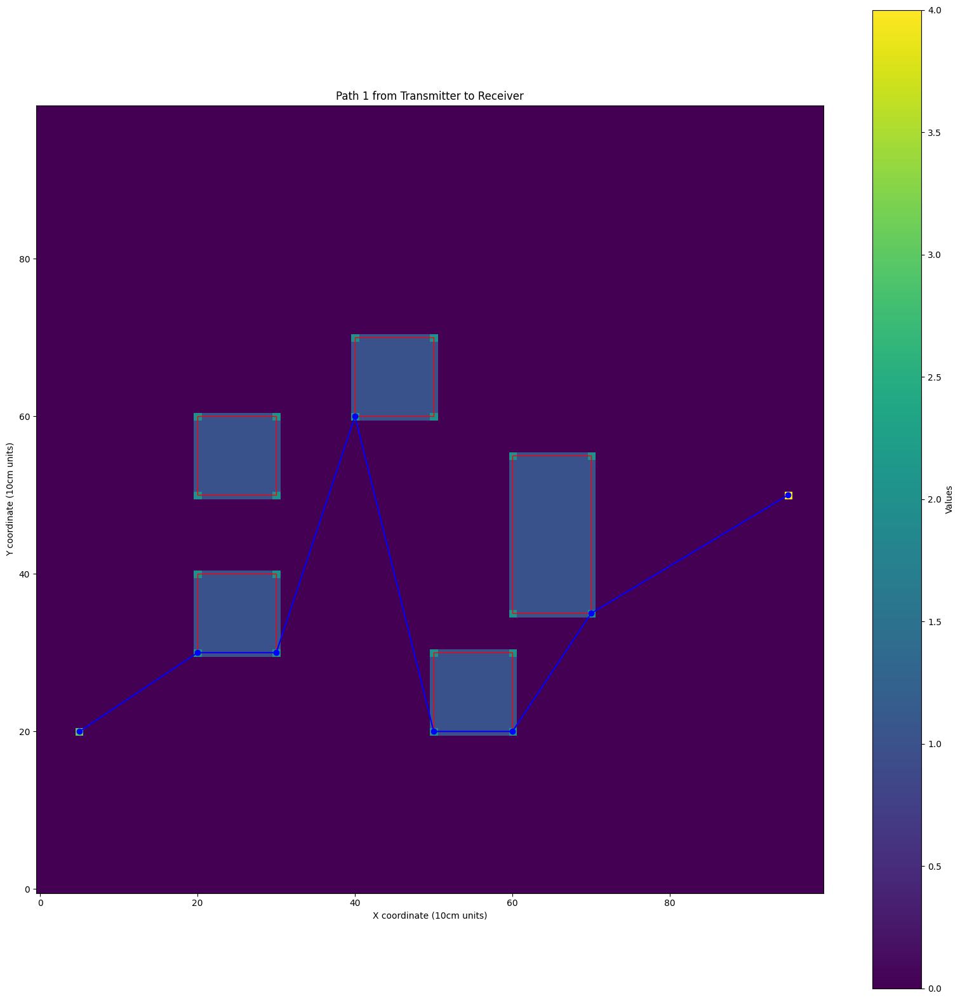

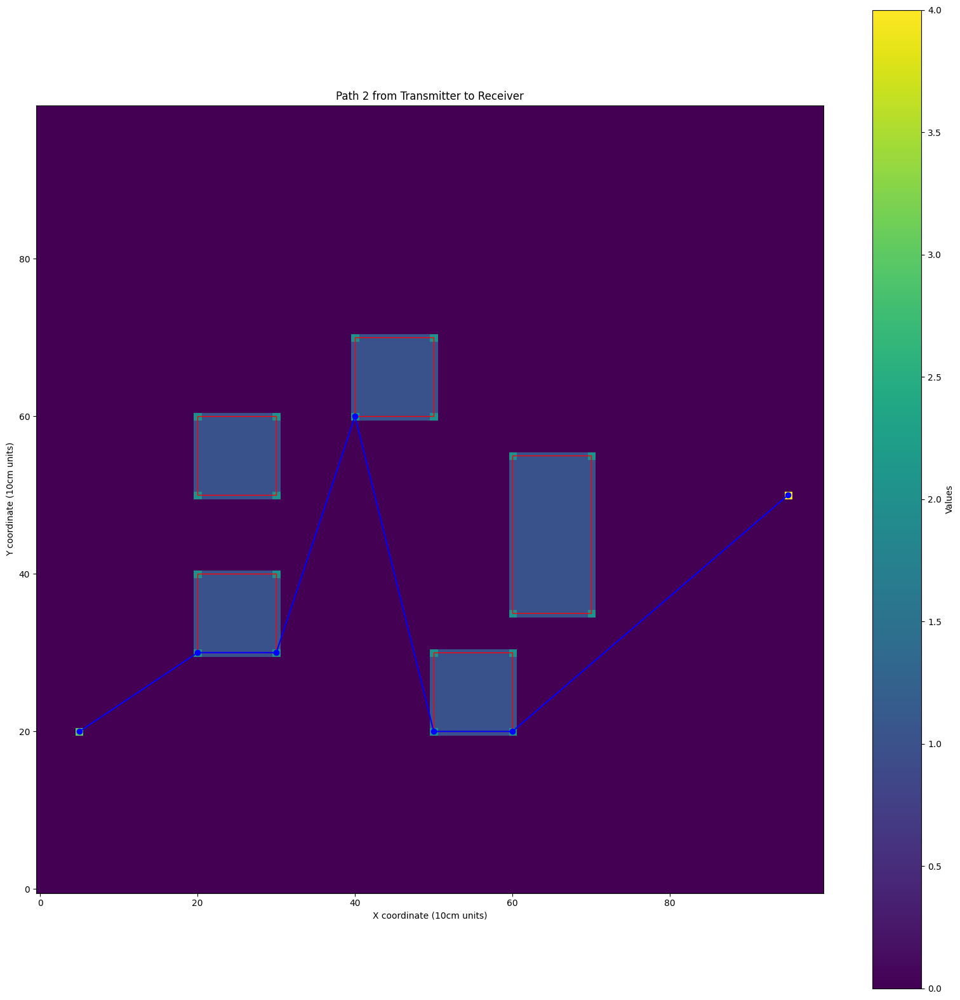

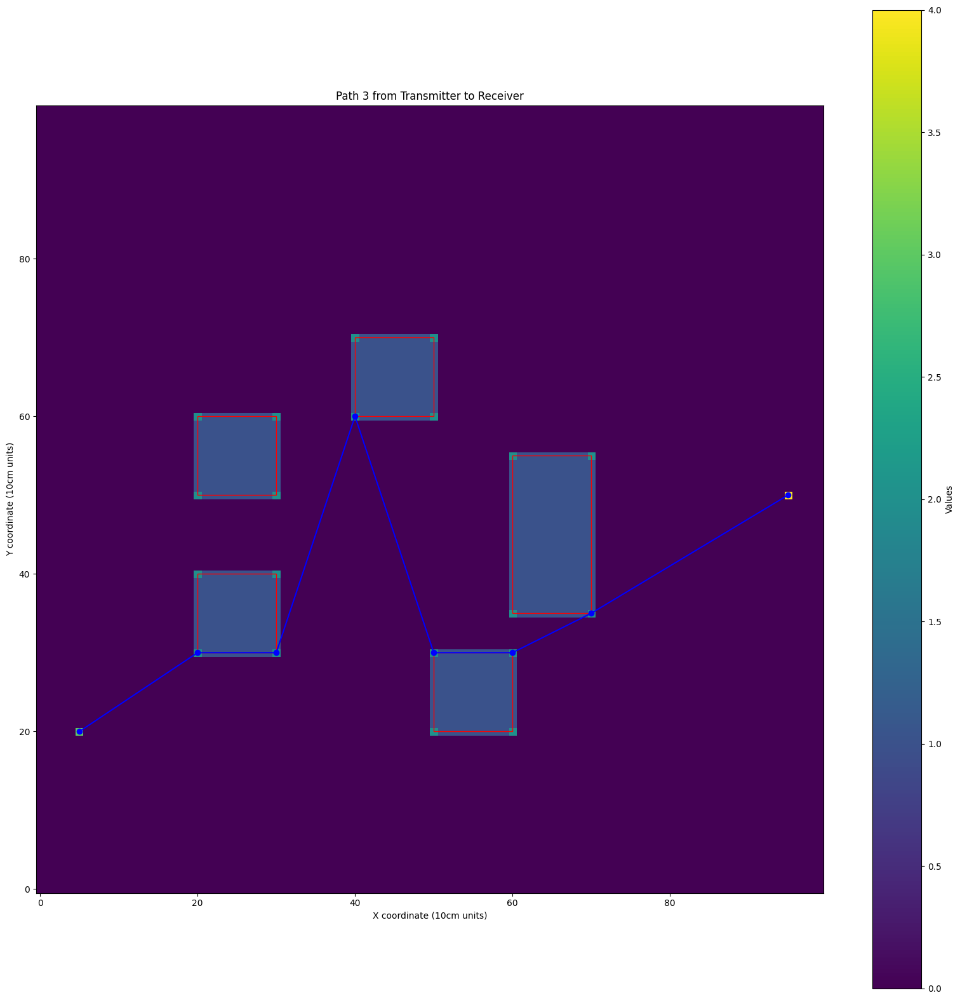

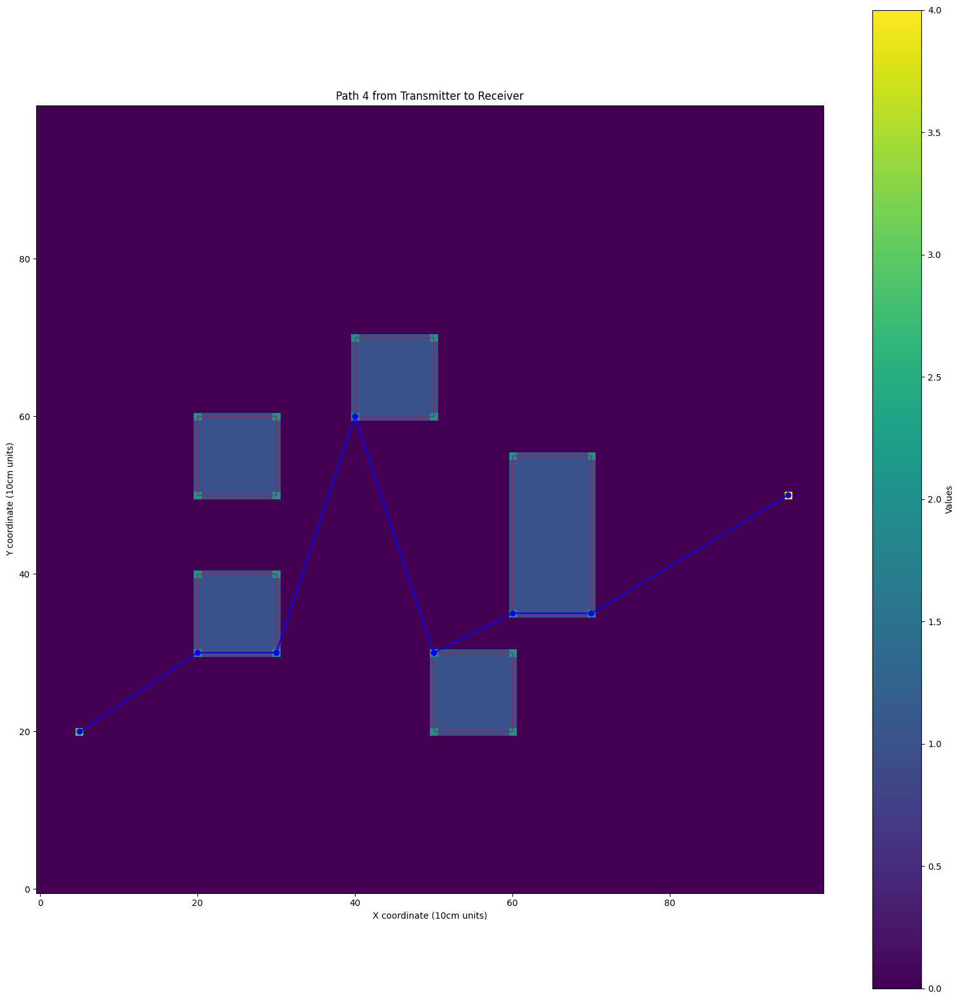

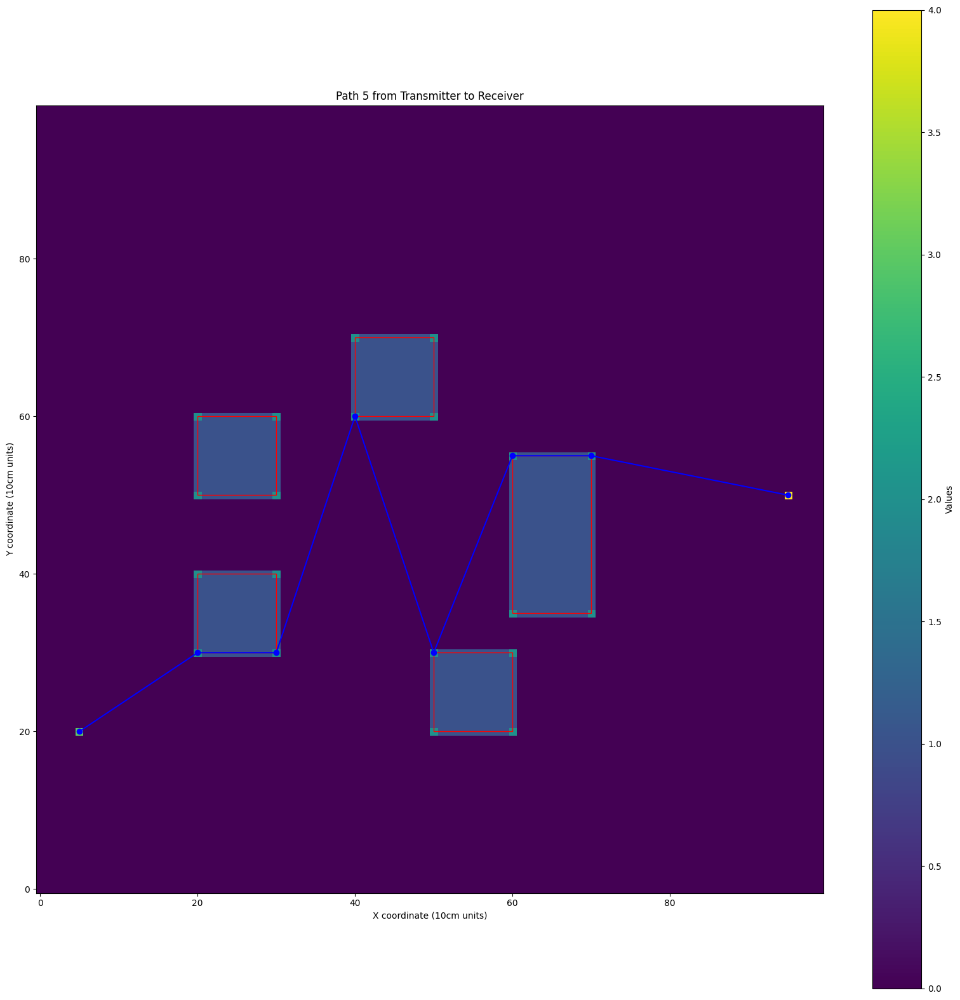

...

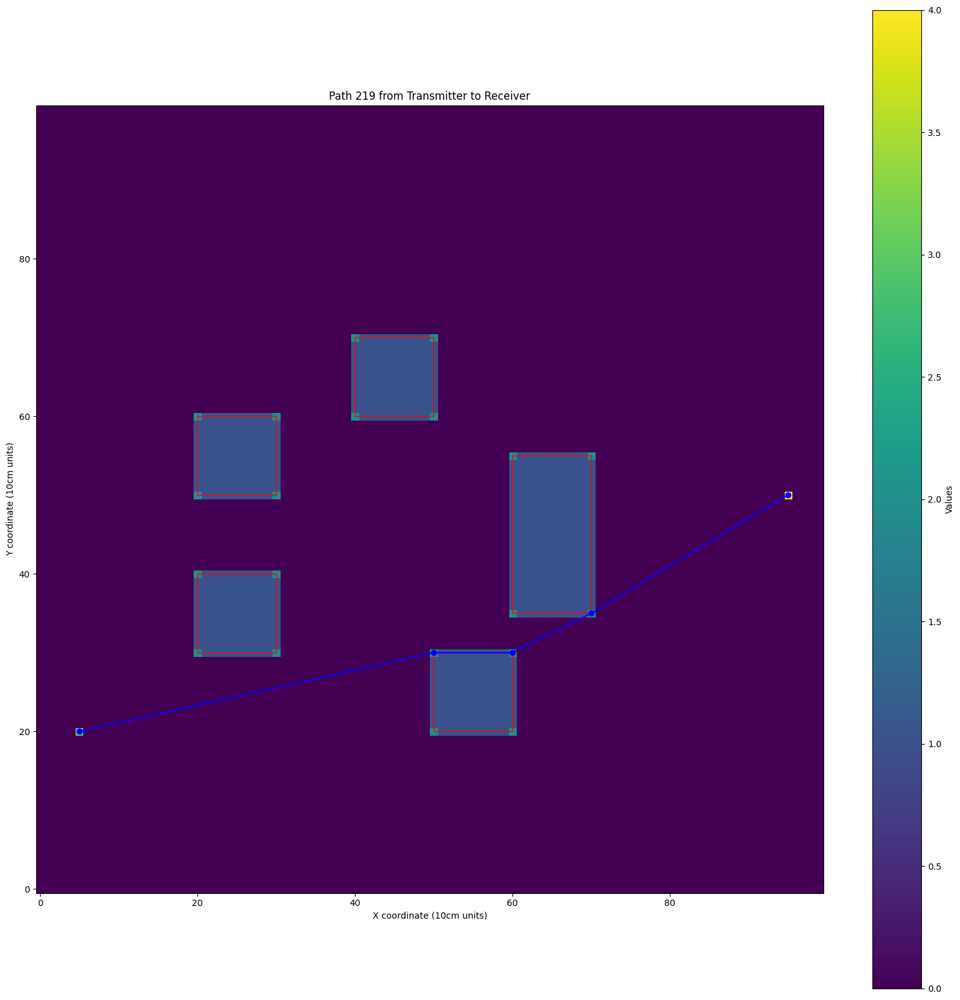

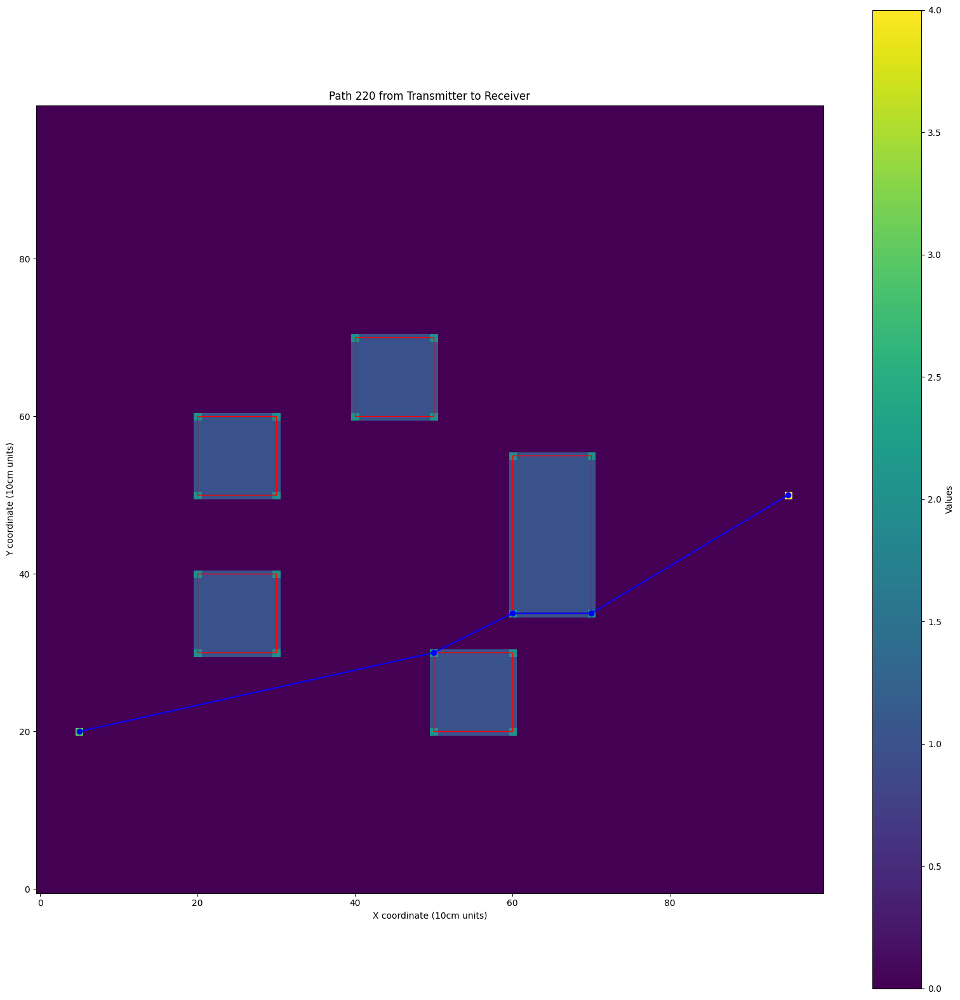

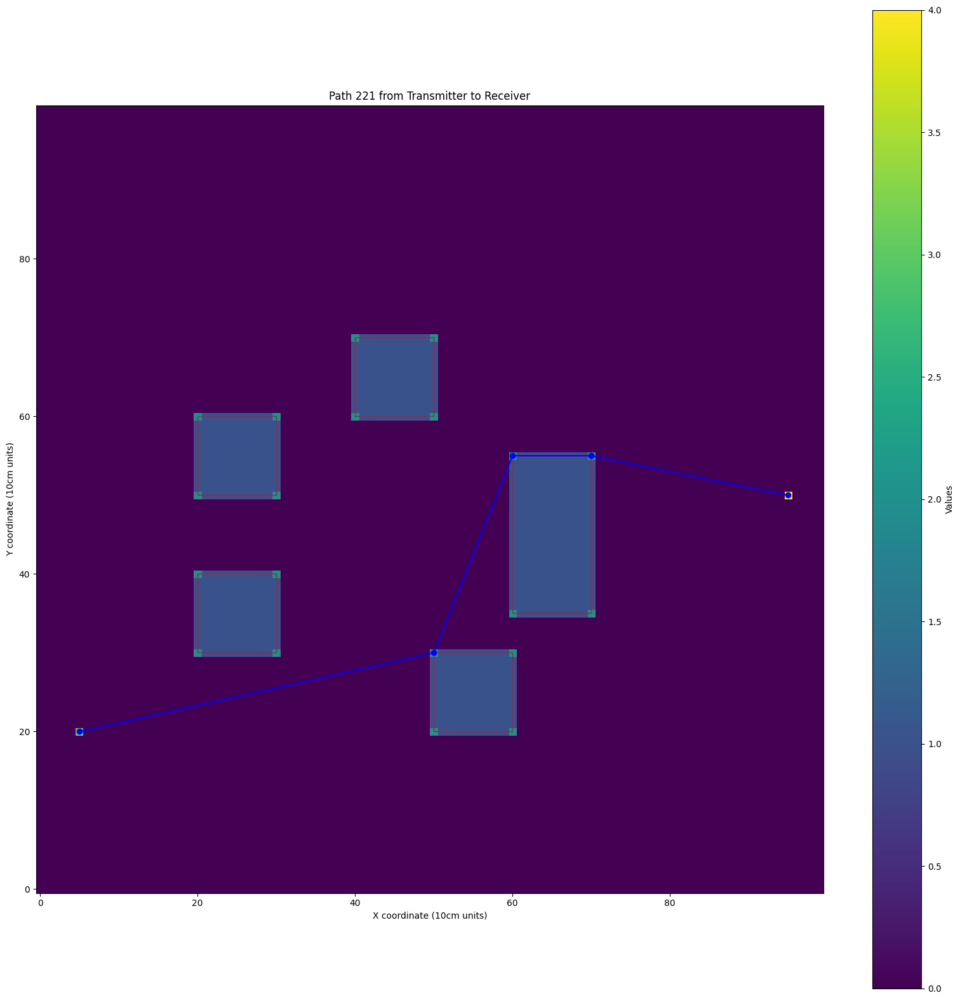

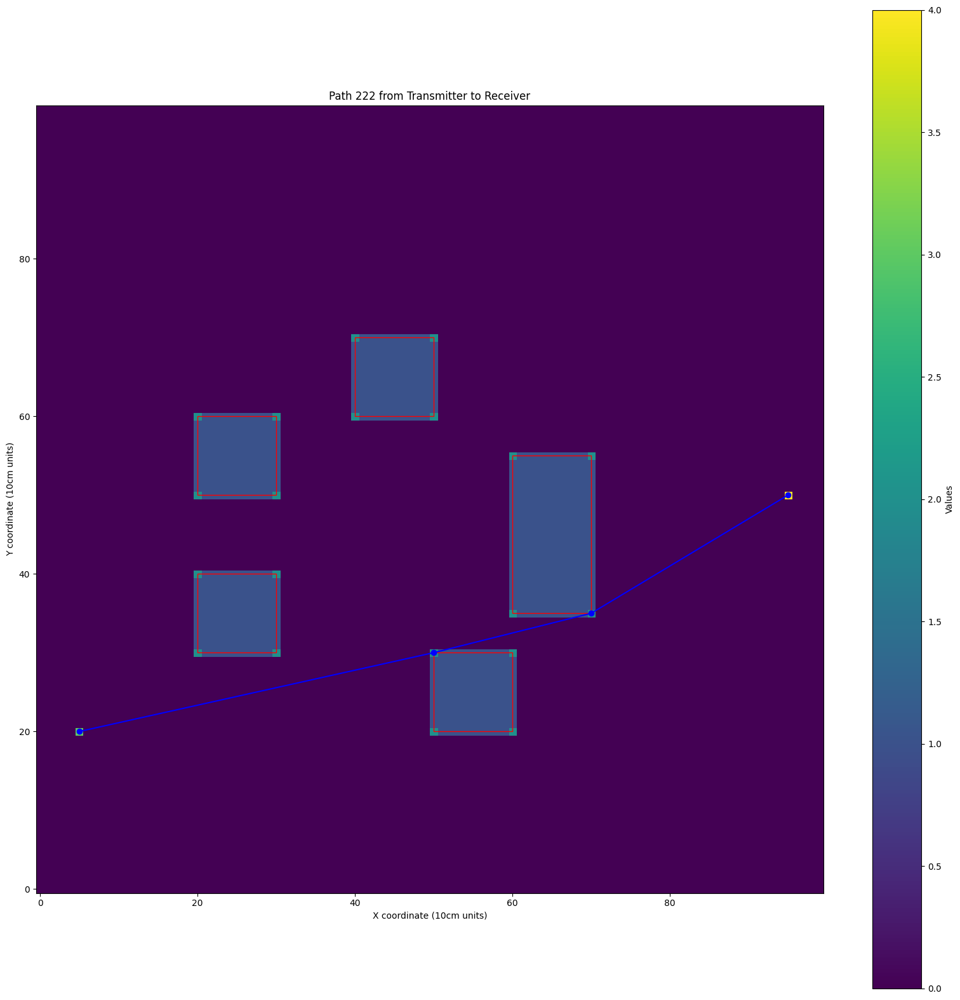

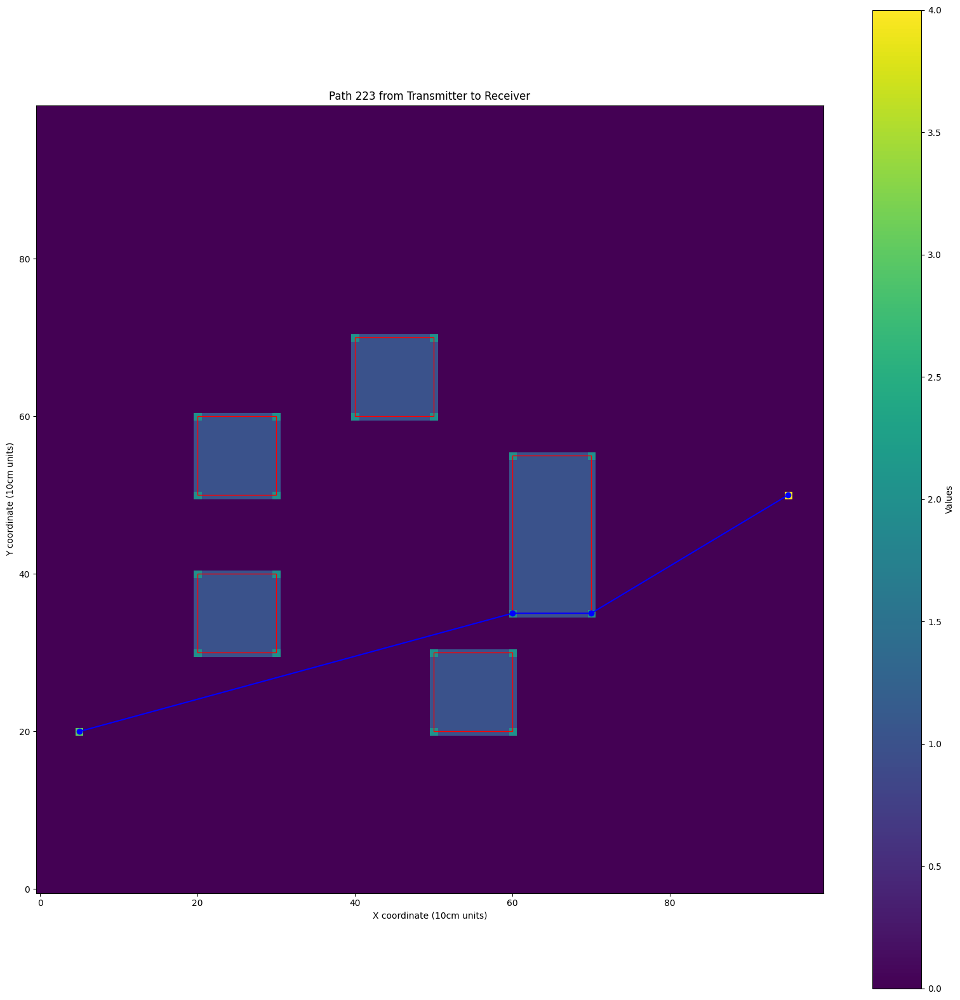

In [15]:
# Import the matplotlib library for creating static, animated, and interactive visualizations in Python
import matplotlib.pyplot as plt

# Define a function to plot the given matrix with the buildings and each path individually
def plot_individual_paths(matrix, buildings, paths):
    """
    Plot the given matrix with the buildings and each path individually.

    Parameters:
    - matrix: The matrix to plot.
    - buildings: A list of buildings, each defined by its top-left and bottom-right corners.
    - paths: A list of paths, each path being a list of points (x, y).
    """
    # For each path in the list of paths
    for i, path in enumerate(paths):
        # Create a new figure with a specified size (20x20)
        plt.figure(figsize=(20, 20))
        
        # Display the matrix as an image, transposing it before plotting for correct orientation
        # The 'viridis' colormap is used, which is a perceptually uniform colormap in matplotlib
        # The origin is set to 'lower' to place the [0,0] index of the array in the bottom left corner of the plot
        plt.imshow(matrix.T, cmap='viridis', origin='lower')
        
        # Add a colorbar to the plot with a label
        plt.colorbar(label='Values')

        # Plot the buildings
        for building in buildings:
            # Get the top-left and bottom-right corners of the building
            top_left = building["top_left"]
            bottom_right = building["bottom_right"]
            
            # Create a rectangle representing the building
            rectangle = plt.Rectangle(top_left, bottom_right[0] - top_left[0], bottom_right[1] - top_left[1], 
                                      linewidth=1, edgecolor='r', facecolor='none')
            
            # Add the rectangle to the plot
            plt.gca().add_patch(rectangle)
        
        # Plot the path
        # Unpack the path into x and y coordinates and plot them with blue circles ('o') as markers
        path_x, path_y = zip(*path)
        plt.plot(path_x, path_y, marker='o', color='b')

        # Set the title of the plot
        plt.title(f'Path {i + 1} from Transmitter to Receiver')
        
        # Set the labels of the x and y axes
        plt.xlabel('X coordinate (10cm units)')
        plt.ylabel('Y coordinate (10cm units)')
        
        # Display the plot
        plt.show()

# Example usage:
# Call the function to plot the matrix with the buildings and each path individually
plot_individual_paths(matrix, buildings, all_paths)


## Applying the model

### Calculating the diffracted waves for just one receiver

In [16]:

# Define the frequency, speed of light, wavelength, and wavenumber
f = 60 * 10^9  # Frequency in Hz
c = 299792458  # Speed of light in m/s
lambda_ = c/f  # Wavelength in meters
k = 2 * np.pi / lambda_  # Wavenumber in rad/m

E0 = 1  # Initial electric field intensity
E = []  # List to store the electric field intensities at the corners

# Define a function to calculate the UTD diffraction coefficient E for a perfectly conducting pi/2 wedge
def calculate_E(E0, R0, v, lambda_, fi, fi_prim):
    D = utd_diffraction_coefficient(fi, fi_prim, R0, v, lambda_)
    return E0 * D * np.sqrt(R0 / (v * (R0 + v))) * np.exp(-1j * k * v)

# For each path in the list of all paths
def E_dif(all_paths):
    for i in range(len(all_paths)):
        path = all_paths[i]
        E_1 = 0
        R0 = 0
        v = 0
        # For each point in the path
        for j in range(len(path)-2):
            start = path[j]
            corner1 = path[j+1]
            corner2 = path[j+2]
                # ...
            if corner_classifications[corner1[0], corner1[1]][0] == 1:
                # Calculate the distances and angles, and compute E_1
                # Repeat the process for the other types of corners
                # ...
                if E_1 == 0:
                    R0 += euclidean_distance(start, corner1)
                    v = euclidean_distance(corner1, corner2)
                    if start[1] > corner1[1]:
                        fi = np.pi/2 - calculate_angle_radians(start, corner1)
                    else:
                        fi = np.pi/2 + calculate_angle_radians(start, corner1)
                    fi_prim = 3 * np.pi/2 - calculate_angle_radians(corner1, corner2)
                    if fi < np.pi and fi_prim > np.pi:
                        E_1 = (1 / R0) * np.exp(-1j * k * R0) * calculate_E(E0, R0, v, lambda_, fi, fi_prim)
                        if corner2 == receiver_location:
                            E.append(E_1)
                            E_1 = 0
                    else:
                        E_1 = 0

                else:
                    R0 += euclidean_distance(start, corner1)
                    v = euclidean_distance(corner1, corner2)
                    if start[1] > corner1[1]:
                        fi = np.pi/2 - calculate_angle_radians(start, corner1)
                    else:
                        fi = np.pi/2 + calculate_angle_radians(start, corner1)
                    fi_prim = 3 * np.pi/2 - calculate_angle_radians(corner1, corner2)
                    if fi < np.pi and fi_prim > np.pi:
                        E_1 = calculate_E(E_1, R0, v, lambda_, fi, fi_prim)
                        if corner2 == receiver_location:
                            E.append(E_1)
                            E_1 = 0
                    else:
                        E_1 = 0


            if corner_classifications[corner1[0], corner1[1]][0] == 2:
                if E_1 == 0:
                    R0 += euclidean_distance(start, corner1)
                    v = euclidean_distance(corner1, corner2)
                    if start[1] > corner1[1]:
                        fi = np.pi/2 + calculate_angle_radians(start, corner1)
                    else:
                        fi = np.pi/2 - calculate_angle_radians(start, corner1)
                    fi_prim = 3 * np.pi/2 - calculate_angle_radians(corner1, corner2)
                    if fi < np.pi and fi_prim > np.pi:
                        E_1 = (1 / R0) * np.exp(-1j * k * R0) * calculate_E(E0, R0, v, lambda_, fi, fi_prim)
                        if corner2 == receiver_location:
                            E.append(E_1)
                            E_1 = 0
                    else:
                        E_1 = 0

                else:
                    R0 += euclidean_distance(start, corner1)
                    v = euclidean_distance(corner1, corner2)
                    if start[1] > corner1[1]:
                        fi = np.pi/2 + calculate_angle_radians(start, corner1)
                    else:
                        fi = np.pi/2 - calculate_angle_radians(start, corner1)
                    fi_prim = 3 * np.pi/2 - calculate_angle_radians(corner1, corner2)
                    if fi < np.pi and fi_prim > np.pi:
                        E_1 = calculate_E(E_1, R0, v, lambda_, fi, fi_prim)
                        if corner2 == receiver_location:
                            E.append(E_1)
                            E_1 = 0
                    else:
                        E_1 = 0



            if corner_classifications[corner1[0], corner1[1]][0] == 3:
                if E_1 == 0:
                    R0 += euclidean_distance(start, corner1)
                    v = euclidean_distance(corner1, corner2)
                    fi = calculate_angle_radians(transmitter_location, corner1)
                    if corner2[1] > corner1[1]:
                        fi_prim = np.pi - calculate_angle_radians(start, corner1)
                    else:
                        fi_prim = np.pi + calculate_angle_radians(start, corner1)
                    if fi < np.pi/2 and fi_prim > np.pi/2:
                        E_1 = (1 / R0) * np.exp(-1j * k * R0) * calculate_E(E0, R0, v, lambda_, fi, fi_prim)
                        if corner2 == receiver_location:
                            E.append(E_1)
                            E_1 = 0
                    else:
                        E_1 = 0

                else:
                    R0 += euclidean_distance(start, corner1)
                    v = euclidean_distance(corner1, corner2)
                    fi = calculate_angle_radians(transmitter_location, corner1)
                    if corner2[1] > corner1[1]:
                        fi_prim = np.pi + calculate_angle_radians(start, corner1)
                    else:
                        fi_prim = np.pi - calculate_angle_radians(start, corner1)
                    if fi < np.pi/2 and fi_prim > np.pi/2:
                        E_1 = calculate_E(E_1, R0, v, lambda_, fi, fi_prim)
                        if corner2 == receiver_location:
                            E.append(E_1)
                            E_1 = 0
                    else:
                        E_1 = 0    



            if corner_classifications[corner1[0], corner1[1]][0] == 4:
                if E_1 == 0:
                    R0 += euclidean_distance(start, corner1)
                    v = euclidean_distance(corner1, corner2)
                    fi = calculate_angle_radians(transmitter_location, corner1)
                    if corner2[1] > corner1[1]:
                        fi_prim = np.pi - calculate_angle_radians(start, corner1)
                    else:
                        fi_prim = np.pi + calculate_angle_radians(start, corner1)
                    if fi < np.pi/2 and fi_prim > np.pi/2:
                        E_1 = (1 / R0) * np.exp(-1j * k * R0) * calculate_E(E0, R0, v, lambda_, fi, fi_prim)
                        if corner2 == receiver_location:
                            E.append(E_1)
                            E_1 = 0
                    else:
                        E_1 = 0

                else:
                    R0 += euclidean_distance(start, corner1)
                    v = euclidean_distance(corner1, corner2)
                    fi = calculate_angle_radians(transmitter_location, corner1)
                    if corner2[1] > corner1[1]:
                        fi_prim = np.pi - calculate_angle_radians(start, corner1)
                    else:
                        fi_prim = np.pi + calculate_angle_radians(start, corner1)
                    if fi < np.pi/2 and fi_prim > np.pi/2:
                        E_1 = calculate_E(E_1, R0, v, lambda_, fi, fi_prim)
                        if corner2 == receiver_location:
                            E.append(E_1)
                            E_1 = 0
                    else:
                        E_1 = 0
    return E
E = E_dif(all_paths)
E

[(3.1236488972197006e-18+3.3830524633387695e-16j),
 (-3.865019335644512e-14+3.9242891684473253e-14j),
 (7.42357524586561e-18+8.850481768185227e-16j),
 (7.398907367731694e-18+8.799350584562174e-16j),
 (3.180004074789338e-18+3.4970621149130087e-16j),
 (-4.2695794527337924e-14+4.33075637927277e-14j),
 (1.1203297733797826e-17+1.4293473244981771e-15j),
 (3.5088151542003015e-17+5.034648824328045e-15j),
 (-2.1746487453273355e-13+2.2006486890784744e-13j),
 (-7.02570812045958e-14+7.124393692797696e-14j),
 (-9.45357510805912e-14+9.581726575355264e-14j),
 (-2.0254655979231185e-13+2.0502462222500565e-13j),
 (-2.1978848153874792e-11+1.1153268418272691e-13j),
 (5.013071180234439e-18+5.558922124163363e-16j),
 (1.3117110304066444e-17+1.6354536939501185e-15j),
 (-1.0508064612214488e-13+1.0649742676927226e-13j),
 (-2.4901166197575893e-11+1.3383343757713738e-13j),
 (-4.0020434297924305e-13+4.0451486662466967e-13j),
 (-7.237138595926973e-11+3.15546139983532e-13j),
 (-8.395261315180735e-13+8.47887704604885

In [17]:
# Initialize variables to store the sums of the real and imaginary parts of the numbers in the list E
real_sum = 0
imaginary_sum = 0

# Loop through each number in the list E
for number in E:
    # Add the real part of the number to real_sum
    real_sum += number.real
    # Add the imaginary part of the number to imaginary_sum
    imaginary_sum += number.imag

# Combine the sums of the real and imaginary parts to get a complex number
sum_complex = complex(real_sum, imaginary_sum)

# Print the sum of the complex numbers
print("Sum of complex numbers:", sum_complex)

# Calculate and print the absolute value (magnitude) of the sum of the complex numbers
print(np.abs(sum_complex))


Sum of complex numbers: (-4.144973287012002e-08-1.4610462746936387e-06j)
1.4616341187695244e-06


### Calculating diffracted waves for the whole map

In [18]:
Diffraction_matrix = np.zeros((100, 100))
for x in range(100):
    for y in range(100):
        if matrix[x][y] == 0 or matrix[x][y] == 4:
            receiver_location = (x, y)
            # Initialize a matrix to store the visibility of each corner
            # This matrix will be used to keep track of which corners of the buildings are visible from the transmitter and receiver
            visibility_matrix = np.zeros((100, 100))
            offset = -1  # Define an offset to adjust the corner points
            
            # Calculate the line of sight for each corner from the transmitter's perspective
            for i, building in enumerate(buildings):
                # For each corner of the building
                for corner in [building["top_left"], (building["top_left"][0], building["bottom_right"][1]), building["bottom_right"], (building["bottom_right"][0], building["top_left"][1])]:
                    # Offset the corner points to avoid the building walls
                    offset_corner = (corner[0] + offset if corner[0] > transmitter_location[0] else corner[0] - offset, 
                                     corner[1] + offset if corner[1] > transmitter_location[1] else corner[1] - offset)
                    # Generate the points along the line from the transmitter to the offset corner
                    line_points = bresenham_line(transmitter_location[0], transmitter_location[1], offset_corner[0], offset_corner[1])
                    # If none of the points on the line are inside a building (value == 1)
                    if not any(matrix[int(x)][int(y)] == 1 for x, y in line_points):
                        # The corner is not blocked from the transmitter's perspective, so add 1 to its value in the visibility matrix
                        visibility_matrix[corner[0], corner[1]] += 1
            
            # Calculate the line of sight for each corner from the receiver's perspective
            for i, building in enumerate(buildings):
                # Only consider corners to the left of the receiver
                for corner in [building["top_left"], (building["top_left"][0], building["bottom_right"][1]), building["bottom_right"], (building["bottom_right"][0], building["top_left"][1])]:
                    if corner[0] < receiver_location[0]:
                        # Offset the corner points to avoid the building walls
                        offset_corner = (corner[0] + offset if corner[0] > receiver_location[0] else corner[0] - offset, 
                                         corner[1] + offset if corner[1] > receiver_location[1] else corner[1] - offset)
                        # Generate the points along the line from the receiver to the offset corner
                        line_points = bresenham_line(receiver_location[0], receiver_location[1], offset_corner[0], offset_corner[1])
                        # If none of the points on the line are inside a building (value == 1)
                        if not any(matrix[int(x)][int(y)] == 1 for x, y in line_points):
                            # The corner is not blocked from the receiver's perspective, so add 2 to its value in the visibility matrix
                            visibility_matrix[corner[0], corner[1]] += 2
            
            # Get the coordinates of the corners with non-zero visibility values
            non_zero_corners = np.transpose(np.nonzero(visibility_matrix))

            # Get the coordinates of the corners with non-zero visibility values
            non_zero_corners = np.transpose(np.nonzero(visibility_matrix))
            all_paths = find_all_paths_dfs(transmitter_location, receiver_location, visibility_matrix, corner_visibility_matrices, adjusted_corners_tuples)
            E = E_dif(all_paths)
            # Initialize sums for real and imaginary parts
            real_sum = 0
            imaginary_sum = 0

            # Sum the real and imaginary parts separately
            for number in E:
                real_sum += number.real
                imaginary_sum += number.imag

            # Combine the sums to get the final result
            sum_complex = complex(real_sum, imaginary_sum)
            Diffraction_matrix[x, y] += np.abs(sum_complex)
            E = []

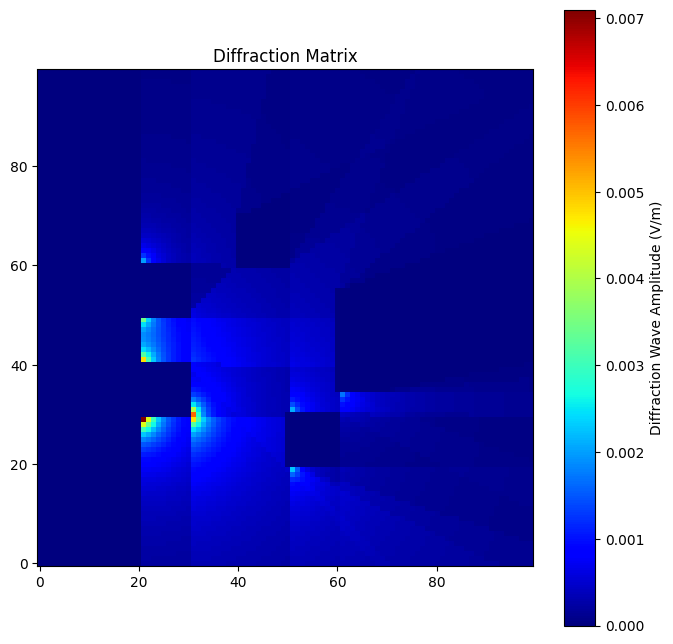

In [26]:
# Import the matplotlib library for creating static, animated, and interactive visualizations in Python
import matplotlib.pyplot as plt

# Your code for generating the Diffraction_matrix goes here
# ...

# Create a new figure with a specified size (10x10)
plt.figure(figsize=(8, 8))

# Display the Diffraction_matrix as an image
# The matrix is transposed before plotting for correct orientation
# The 'jet' colormap is used, which is a perceptually uniform colormap in matplotlib
# The interpolation method is set to 'nearest' to display each cell as a square of uniform color
# The origin is set to 'lower' to place the [0,0] index of the array in the bottom left corner of the plot
plt.imshow(Diffraction_matrix.T, cmap='jet', interpolation='nearest', origin="lower")

# Add a colorbar to the plot with a label
plt.colorbar(label='Diffraction Wave Amplitude (V/m)')

# Set the title of the plot
plt.title('Diffraction Matrix')

# Display the plot
plt.show()


##### As depicted in the figure, the diffraction of waves originates from the leftmost point of the buildings.

### LOS wave

In [20]:
Wave_matrix = np.zeros((100, 100))

def LOS_is_blocked(corner1, corner2, matrix):
    # Generate the points on the line between corner1 and corner2.
    line_points = bresenham_line(corner1[0], corner1[1], corner2[0], corner2[1])

    # Check if any of the points on the line is blocked in the matrix.
    is_path_blocked = any(matrix[int(x)][int(y)] == 1 for x, y in line_points)
    d = corner1[0] - corner2[0]
    # Check if any of the points on the line is a corner in the matrix.
    is_corner_in_path = any(matrix[int(x)][int(y)] == 2 for x, y in line_points)
    is_backward = d > 0
    # Return True if there is a blockage or a corner between corner1 and corner2.
    f = is_path_blocked
    return f

for x in range(100):
    for y in range(100):
        if matrix[x][y] == 0 or matrix[x][y] == 4:
            E_1 = 0
            receiver_location = (x, y)
            if not LOS_is_blocked(transmitter_location, receiver_location, matrix):
                R0 = euclidean_distance(transmitter_location, receiver_location)
                E_1 = (E0 / R0) * np.exp(-1j * k * R0)
            
                
            real_sum = 0
            imaginary_sum = 0
            # Sum the real and imaginary parts separately
            
            real_sum += E_1.real
            imaginary_sum += E_1.imag
            # Combine the sums to get the final result
            sum_complex = complex(real_sum, imaginary_sum)
            Wave_matrix[x, y] = np.abs(sum_complex) + Diffraction_matrix[x, y]

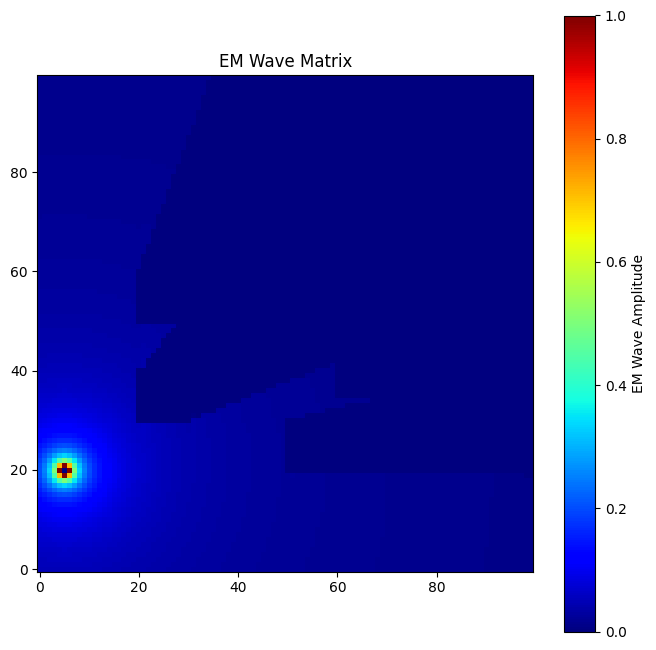

In [27]:
# Import the matplotlib library for creating static, animated, and interactive visualizations in Python
import matplotlib.pyplot as plt

# Your code for generating the Diffraction_matrix goes here
# ...

# Create a new figure with a specified size (10x10)
plt.figure(figsize=(8, 8))

# Display the Wave_matrix as an image
# The matrix is transposed before plotting for correct orientation
# The 'jet' colormap is used, which is a perceptually uniform colormap in matplotlib
# The interpolation method is set to 'nearest' to display each cell as a square of uniform color
# The origin is set to 'lower' to place the [0,0] index of the array in the bottom left corner of the plot
plt.imshow(Wave_matrix.T, cmap='jet', interpolation='nearest', origin="lower")

# Add a colorbar to the plot with a label
plt.colorbar(label='EM Wave Amplitude')

# Set the title of the plot
plt.title('EM Wave Matrix')

# Display the plot
plt.show()

In [22]:
import math
Diffraction_matrix_db = np.zeros((100, 100))
for x in range(100):
    for y in range(100):
        if Diffraction_matrix[x, y] > 0:
            Diffraction_matrix_db[x , y] = math.log(Diffraction_matrix[x, y]) * 20
        else:
            Diffraction_matrix_db[x , y] = 0  # or any other value you want to assign

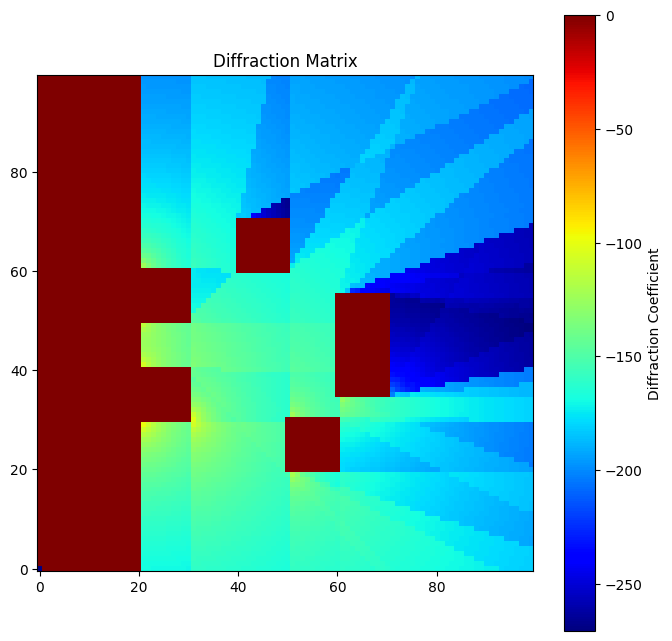

In [23]:
# Import the matplotlib library for creating static, animated, and interactive visualizations in Python
import matplotlib.pyplot as plt

# Your code for generating the Diffraction_matrix goes here
# ...

# Create a new figure with a specified size (10x10)
plt.figure(figsize=(8, 8))

# Display the Diffraction_matrix_db as an image
# The matrix is transposed before plotting for correct orientation
# The 'jet' colormap is used, which is a perceptually uniform colormap in matplotlib
# The interpolation method is set to 'nearest' to display each cell as a square of uniform color
# The origin is set to 'lower' to place the [0,0] index of the array in the bottom left corner of the plot
plt.imshow(Diffraction_matrix_db.T, cmap='jet', interpolation='nearest', origin="lower")

# Add a colorbar to the plot with a label
plt.colorbar(label='Diffraction Coefficient')

# Set the title of the plot
plt.title('Diffraction Matrix')

# Display the plot
plt.show()

In [24]:
import math
Wave_matrix_db = np.zeros((100, 100))
for x in range(100):
    for y in range(100):
        if Wave_matrix[x, y] > 0:
            Wave_matrix_db[x , y] = math.log(Wave_matrix[x, y]) * 20
        else:
            Wave_matrix_db[x , y] = 0  # or any other value you want to assign

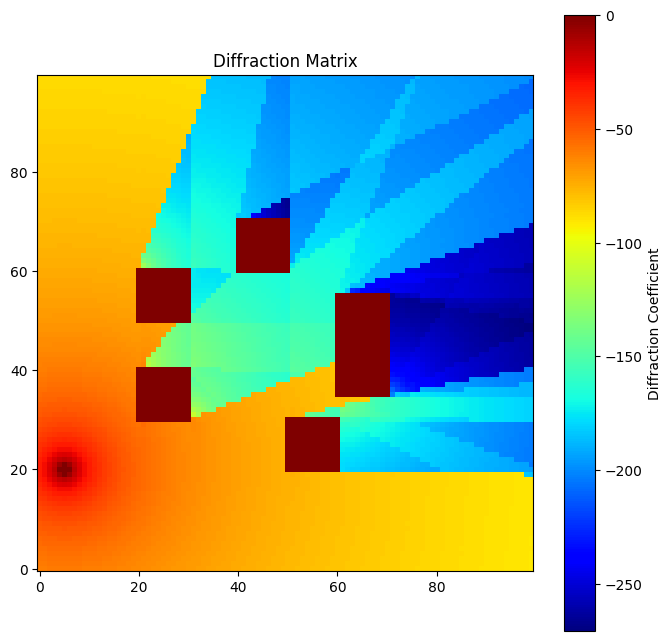

In [25]:
# Import the matplotlib library for creating static, animated, and interactive visualizations in Python
import matplotlib.pyplot as plt

# Your code for generating the Diffraction_matrix goes here
# ...

# Create a new figure with a specified size (10x10)
plt.figure(figsize=(8, 8))

# Display the Wave_matrix_db as an image
# The matrix is transposed before plotting for correct orientation
# The 'jet' colormap is used, which is a perceptually uniform colormap in matplotlib
# The interpolation method is set to 'nearest' to display each cell as a square of uniform color
# The origin is set to 'lower' to place the [0,0] index of the array in the bottom left corner of the plot
plt.imshow(Wave_matrix_db.T, cmap='jet', interpolation='nearest', origin="lower")

# Add a colorbar to the plot with a label
plt.colorbar(label='Diffraction Coefficient')

# Set the title of the plot
plt.title('Diffraction Matrix')

# Display the plot
plt.show()